In [1]:
import os
import torch
import pickle
import numpy as np
import pandas as pd
from rdkit import Chem
from rdkit import DataStructs
from scipy.stats import wasserstein_distance
from environment.RPNMR import predictor_new as P
from environment.chemprop_IR.smiles_predict import Forward_IR

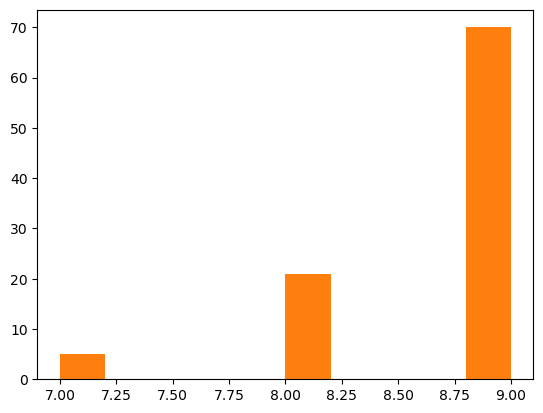

In [5]:
import os
import pickle
from rdkit import Chem


#for filename in os.listdir('~/DeepSPInN/test/test_outputs'):
first_test_path = '~/DeepSPInN/test/test_outputs/'

all_files = os.listdir(test_test_path)
all_files = [test_test_path+x for x in all_files]

all_files = sorted(all_files, key=lambda x:int(x.split('_')[-1].split('.')[0]))

num_atoms = list()
for filename in all_files:
    with open(os.path.join('~/DeepSPInN/test/test_outputs', filename), 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        num_atoms.append(Chem.MolFromSmiles(current_mol_log[0][0]).GetNumAtoms())

import matplotlib.pyplot as plt

plt.hist(num_atoms)
plt.show()

In [2]:
all_lines = []
all_lines.clear()
for filename in os.listdir('~/DeepSPInN/test/temp_test_outputs'):
    with open(os.path.join('~/DeepSPInN/test/temp_test_outputs', filename), 'r') as f: # open in readonly mode
        lines = f.readlines()#[:-1]
        all_lines.append(lines)

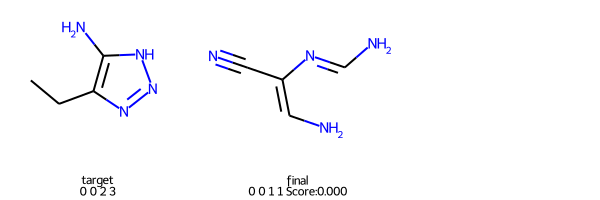

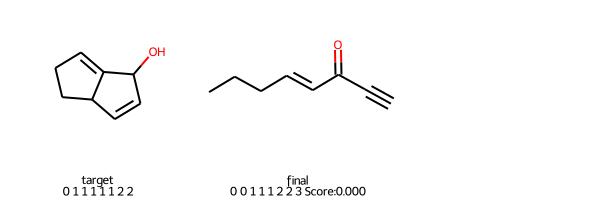

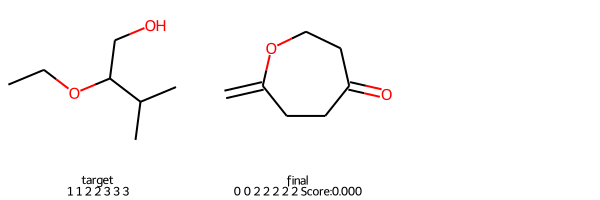

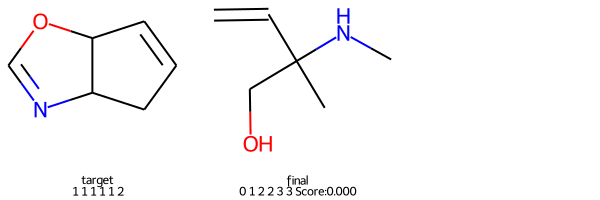

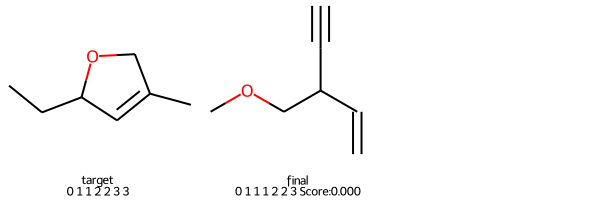

...

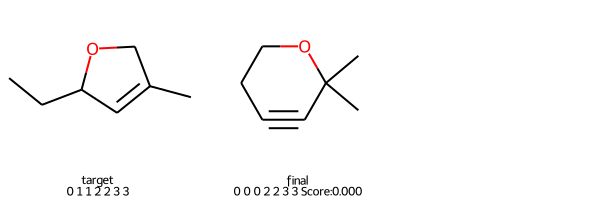

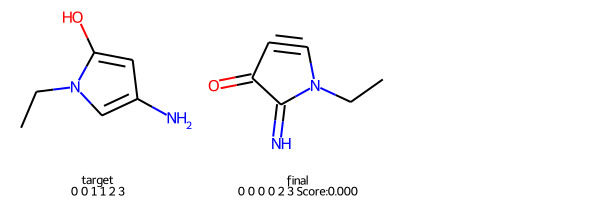

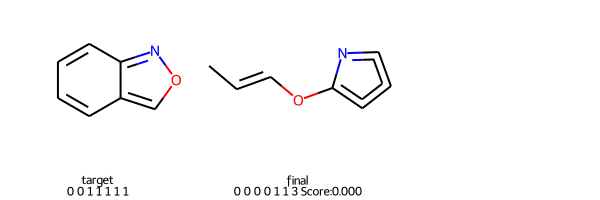

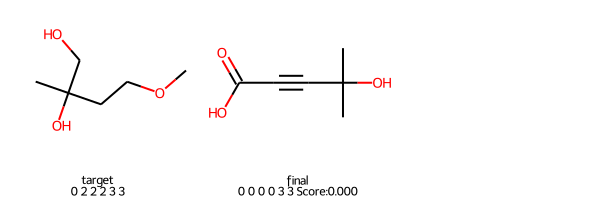

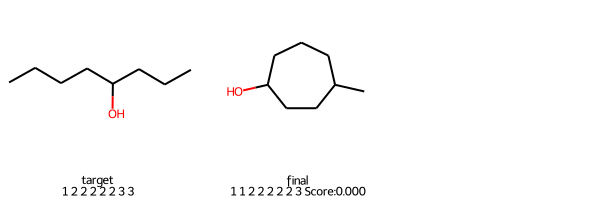

In [6]:
target_predicted_score = list()

for file_lines in all_lines:
    for line in file_lines:
        if "Reward" not in line:
            continue
        words = line.split()
        target = Chem.CanonSmiles(words[1])
        final_reached = Chem.CanonSmiles(words[-4])
        score = float(words[-1])
        
        target_mol = Chem.MolFromSmiles(target)
        final_mol = Chem.MolFromSmiles(final_reached)
        
        target_atoms = list()
        final_atoms = list()
        
        for atom in target_mol.GetAtoms():
            if atom.GetSymbol() == 'C':
                target_atoms.append(atom.GetTotalNumHs())
                
        for atom in final_mol.GetAtoms():
            if atom.GetSymbol() == 'C':
                final_atoms.append(atom.GetTotalNumHs())
                
        target_atoms = sorted(target_atoms)
        final_atoms = sorted(final_atoms)
        
        if target_atoms != final_atoms:
            mols = [target_mol, final_mol]
            img = Chem.Draw.MolsToGridImage(mols, legends=["target\n" + ' '.join([str(gint) for gint in target_atoms]), "final\n" + ' '.join([str(gint) for gint in final_atoms]) + ' Score:' + '{:.3f}'.format(score)])
            display(img)

In [5]:
# Find the number of times each of the molecules has been predicted

all_mols = {}
for file_lines in all_lines:
    for line in file_lines:
        if "Reward" not in line:
            continue
        words = line.split()
        target = Chem.CanonSmiles(words[1])
        final_reached = Chem.CanonSmiles(words[-4])
        if target not in all_mols:
            all_mols[target] = [0,0]
        all_mols[target][1] += 1
        if target == final_reached:
            all_mols[target][0] += 1

print(all_mols)

{'CCc1nn[nH]c1N': [67, 120], 'OC1C=CC2CCC=C12': [3, 60]}


In [3]:
# Get the rewards and choose the top 3 hits

import os

with open('~/DeepSPInN/data/qm9_broad_ir_tifr_extrap_shift.pkl', 'rb') as handle:
    nmr_ir_full = pickle.load(handle)

ir_forward = Forward_IR("../models/IR_Forward" , False)
#nmr_forward = P.NMRPredictor("~/DeepSPInN/models/RPNMR/best_model.meta","~/DeepSPInN/models/RPNMR/best_model.00000000.state", True)

# ir_forward.predict_smiles('C')
# nmr_forward.predict('C')

Loaded all checkpoint models


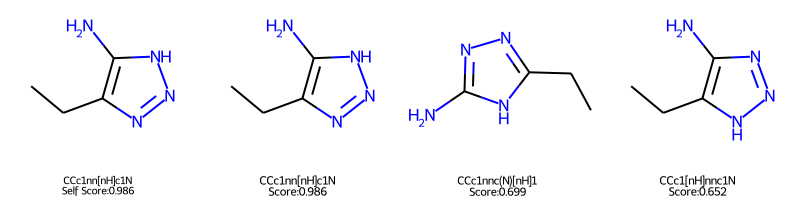

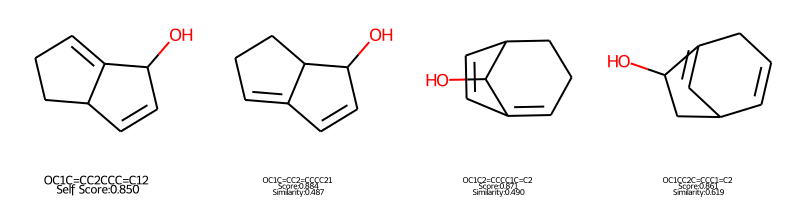

All Mols 2 ['CCc1nn[nH]c1N', 'OC1C=CC2CCC=C12']
Predicted Mols 1 ['CCc1nn[nH]c1N']
Ratio: 0.5


In [4]:
# Get the rewards and choose the top 3 hits

def SIDLoss(a, b):
    # a is predicted, b is target
    a = torch.FloatTensor(a)
    b = torch.FloatTensor(b)
    threshold = 1e-8
    nan_mask=torch.isnan(b)+torch.isnan(a)
    zero_sub=torch.zeros_like(b)

    a[a < threshold] = threshold
    sum_model_spectra = torch.sum(torch.where(nan_mask,zero_sub,a))
    a = torch.div(a,sum_model_spectra)

    b[b < threshold] = threshold
    sum_target_spectra = torch.sum(torch.where(nan_mask,zero_sub,b))
    b = torch.div(b,sum_target_spectra)

    loss = torch.ones_like(b)
    a[nan_mask]=1
    b[nan_mask]=1
    loss = torch.mul(torch.log(torch.div(a,b)),a) + torch.mul(torch.log(torch.div(b,a)),b)
    loss[nan_mask]=0
    loss = torch.sum(loss)

    return loss.item()

# make the dict that has all the reached molecules for each target molecule
all_mols = dict()
for file_lines in all_lines:
    for line in file_lines:
        
        if "Reward" not in line:
            continue
            
        words = line.split()
        target = Chem.CanonSmiles(words[1])
        final_reached = Chem.CanonSmiles(words[-4])
        
        if target not in all_mols:
            all_mols[target] = list()
            
        all_mols[target].append(final_reached)

# make a set so that you have each reached molecule only once
for mol in all_mols:
    all_mols[mol] = list(set(all_mols[mol]))

total_mols = list()
predicted_mols = list()
for mol in all_mols:
    total_mols.append(mol)
    
    target_mol = mol
    
    # get the normalized target IR and NMR of the molecule
    target_row = nmr_ir_full.loc[nmr_ir_full.SMILES == target_mol]
    
    target_ir = target_row.iloc[0].IR_Data
    target_ir = torch.FloatTensor(target_ir)
    target_ir /= torch.sum(target_ir)
    
    target_nmr = target_row.iloc[0].NMR_Shift_Split
    target_nmr = [x[0] for x in target_nmr]
    target_nmr = np.array(target_nmr)
    target_nmr /= 220
    target_nmr = sorted(target_nmr)
    
    pred_scores = dict()
    
    # for each predicted molecule, get a score using both IR and NMR
    mols_to_check = list()
    mols_to_check.append(mol)
    mols_to_check.extend(all_mols[mol])
    
    for pred_mol in mols_to_check:
        
        pred_ir = ir_forward.predict_smiles(pred_mol)
        pred_ir = torch.FloatTensor(pred_ir)
        pred_ir /= torch.sum(pred_ir)
    
        sid = SIDLoss(pred_ir, target_ir)
        # sis is the IR distance of the predicted molecule
        sis = 1.0/(1+sid)
        
#         # nmr_dist is the NMR distance of the predicted molecule
#         nmr_dist = 0
#         pred_nmr = nmr_forward.predict(pred_mol)
#         if pred_nmr != -1:
#             pred_nmr = np.array(pred_nmr)
#             pred_nmr /= 220

#             pred_nmr = sorted(pred_nmr)
#             diff_in_atoms = len(target_nmr) - len(pred_nmr)

#             if diff_in_atoms == 0:
#                 nmr_dist = 1 - wasserstein_distance(pred_nmr, target_nmr)
        
#         score = (sis + nmr_dist)/2
        score = sis
        
        pred_scores[pred_mol] = score
    
    # sort the molecules based on the descending order of their scores
    all_mols[mol] = sorted(all_mols[mol], key=lambda x: pred_scores[x], reverse=True)
    
    if Chem.CanonSmiles(all_mols[mol][0]) == Chem.CanonSmiles(mol):
        predicted_mols.append(mol)
    
        # get the names of the original molecule, top 3 molecules and their scores
        top_3_mol_names = [x + '\nScore:' + '{:.3f}'.format(pred_scores[x]) for x in all_mols[mol][:3]]

    else:
        # get the names of the original molecule, top 3 molecules and their scores and similarity to target mol
        top_3_mol_names = [x + '\nScore:' + '{:.3f}'.format(pred_scores[x]) + 
                           '\nSimilarity:' + 
                           '{:.3f}'.format(DataStructs.FingerprintSimilarity(Chem.RDKFingerprint(Chem.MolFromSmiles(mol)), Chem.RDKFingerprint(Chem.MolFromSmiles(x))))
                           for x in all_mols[mol][:3]]

    top_3_mol_names.insert(0, mol + '\nSelf Score:' + '{:.3f}'.format(pred_scores[mol]))
    
    # get the mol objects of the original molecule, top 3 molecules
    top_3_mols = [Chem.MolFromSmiles(x) for x in all_mols[mol][:3]]
    top_3_mols.insert(0, Chem.MolFromSmiles(mol))
    
    # draw the target molecule and the predicted molecules
    img = Chem.Draw.MolsToGridImage(top_3_mols, legends=top_3_mol_names, molsPerRow=4)
    display(img)

print('All Mols', len(total_mols), total_mols)
print('Predicted Mols', len(predicted_mols), predicted_mols)
print('Ratio:', float(len(predicted_mols))/len(total_mols))

In [19]:
# Find if the reached molecules have less atoms than the target molecule

all_mols = {}
for file_lines in all_lines:
    for line in file_lines:
        words = line.split()
        target = Chem.CanonSmiles(words[1])
        final_reached = Chem.CanonSmiles(words[-4])
        if target not in all_mols:
            all_mols[target] = []
        
        
        mol1 = Chem.MolFromSmiles(target)
        mol2 = Chem.MolFromSmiles(final_reached)
        
        if len(mol1.GetAtoms()) != len(mol2.GetAtoms()):
            print(target, 'has loose atoms to give', final_reached)
            all_mols[target].append(final_reached)
        
print(all_mols)

CCOC(CO)C(C)C has loose atoms to give C=CCC
{'CCOC(CO)C(C)C': ['C=CCC']}


In [6]:
total_mols = 0
predicted_mols = 0
for mol in all_mols:
    if all_mols[mol][0] != 0:
        predicted_mols += 1
    total_mols += 1
print(predicted_mols, total_mols)

5 11


0 80


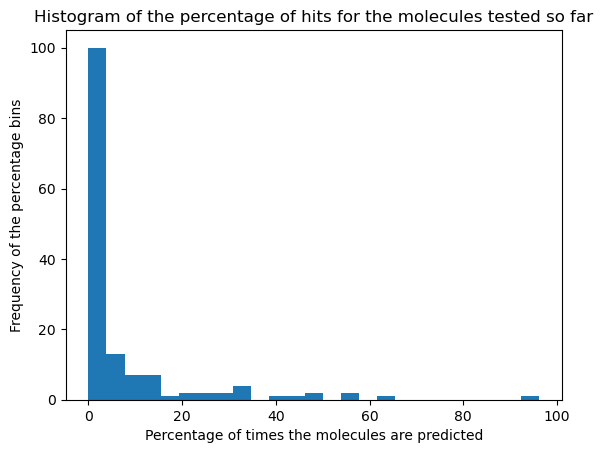

In [6]:
percentages = []
percentages.clear()
for mol in all_mols:
    percentages.append(all_mols[mol][0]*100.0/all_mols[mol][1])
    if mol == Chem.CanonSmiles('CC1C=CC(=O)NC1=N'):
        print(all_mols[mol][0],all_mols[mol][1])

import matplotlib.pyplot as plt
plt.hist(percentages, bins = 25)
plt.xlabel('Percentage of times the molecules are predicted')
plt.ylabel('Frequency of the percentage bins')
plt.title('Histogram of the percentage of hits for the molecules tested so far')
plt.show()

In [ ]:
target_smiles = 'CC1COC(C)C(C)C1'
target_mol = Chem.MolFromSmiles(target_smiles)
display(Chem.Draw.MolToImage(target_mol))

ms = []
ms_names = []
ms_names.clear()
ms.clear()

for file_lines in all_lines:
    for line in file_lines:
        words = line.split()
        target = Chem.CanonSmiles(words[1])
        final_reached = Chem.CanonSmiles(words[-1])
        if target == target_smiles:
            ms.append(Chem.MolFromSmiles(final_reached))
            ms_names.append(final_reached)

img=Chem.Draw.MolsToGridImage(ms[:8],molsPerRow=4,subImgSize=(200,200),legends=ms_names[:8])
img

In [ ]:
mol = Chem.MolFromSmiles('CC1C=CC(=O)NC1=N')
mol

In [ ]:
for file_lines in all_lines:
    for line in file_lines:
        words = line.split()
        target = Chem.CanonSmiles(words[1])
        final_reached = Chem.CanonSmiles(words[-1])
        if target == 'CC1C=CC(=O)NC1=N':
            if 'COC' in final_reached:
                print(final_reached)

In [ ]:
mol = Chem.MolFromSmiles('CC1(C)COC=NC1=N')
mol

In [ ]:
mol = Chem.MolFromSmiles('CC1C=CC(=O)NC1=N')
mol

In [ ]:
previous = {'CCCC(CCO)=NO': [5, 28], 'N#CCc1c[nH]c(O)n1': [0, 28], 'O=CNC(=O)C(F)(F)F': [14, 28], 'CC12CC3CC1OC3O2': [14, 28], 'CC1(C#N)C=CC(=O)C1': [3, 28], 'CC1=CCCCCC1O': [3, 28], 'O=C1CCCCCN1': [21, 28], 'N=c1onc(O)nc1N': [0, 12]}
for mol in previous:
    print(mol, previous[mol][0]/previous[mol][1], all_mols[mol][0]/all_mols[mol][1])

In [5]:
with open('~/DeepSPInN/data/qm9_clean_ir_nmr.pickle', 'rb') as handle:
    all_inmr = pickle.load(handle)
all_inmr = all_inmr["test"]

In [6]:
print(all_inmr[0])

('CCc1nn[nH]c1N', [4, 4, 0, 0], array([0.00028718, 0.00028067, 0.00028798, ..., 0.00025347, 0.00025763,
       0.000252  ]), [(13.519665951331007, 3), (18.557094889590388, 2), (132.37324688957335, 0), (135.03761839486504, 0)], 'dsgdb9nsd_020801')


In [2]:
ir_forward = Forward_IR("../models/IR_Forward" , False)

import os

with open('~/DeepSPInN/data/qm9_broad_ir_tifr_extrap_shift.pkl', 'rb') as handle:
    nmr_ir_full = pickle.load(handle)
    
def SIDLoss(a, b):
    # a is predicted, b is target
    a = torch.FloatTensor(a)
    b = torch.FloatTensor(b)
    threshold = 1e-8
    nan_mask=torch.isnan(b)+torch.isnan(a)
    zero_sub=torch.zeros_like(b)

    a[a < threshold] = threshold
    sum_model_spectra = torch.sum(torch.where(nan_mask,zero_sub,a))
    a = torch.div(a,sum_model_spectra)

    b[b < threshold] = threshold
    sum_target_spectra = torch.sum(torch.where(nan_mask,zero_sub,b))
    b = torch.div(b,sum_target_spectra)

    loss = torch.ones_like(b)
    a[nan_mask]=1
    b[nan_mask]=1
    loss = torch.mul(torch.log(torch.div(a,b)),a) + torch.mul(torch.log(torch.div(b,a)),b)
    loss[nan_mask]=0
    loss = torch.sum(loss)

    return loss.item()

Loaded all checkpoint models


In [4]:
for target_mol in ['Cc1cnn(C(N)=O)n1', 'CN=C1OCC(C)C1O', 'CCNc1[nH]nnc1C', 'C1=NCc2n[nH]cc2O1', 'N#CC1=CCC(O)C1N', 'CNc1onnc1C=O', 'Nc1nc(CO)[nH]c1O']:

    target_row = nmr_ir_full.loc[nmr_ir_full.SMILES == target_mol]
    target_ir = target_row.iloc[0].IR_Data
    target_ir = torch.FloatTensor(target_ir)
    target_ir /= torch.sum(target_ir)
    
    pred_ir = ir_forward.predict_smiles(target_mol)
    pred_ir = torch.FloatTensor(pred_ir)
    pred_ir /= torch.sum(pred_ir)

    sid = SIDLoss(pred_ir, target_ir)
    # sis is the IR distance of the predicted molecule
    sis = 1.0/(1+sid)
    
    print(target_mol, sis)

Cc1cnn(C(N)=O)n1 0.9911285670244524
CN=C1OCC(C)C1O 0.9180554222791609
CCNc1[nH]nnc1C 0.9806934311874727
C1=NCc2n[nH]cc2O1 0.8751529326622123
N#CC1=CCC(O)C1N 0.6360604356167421
CNc1onnc1C=O 0.44517039721042523
Nc1nc(CO)[nH]c1O 0.9890344321131291


In [2]:
import os
import sys
import pickle
import numpy as np
from rdkit import Chem

if len(sys.argv) == 1:
    print_mols = False
else:
    print_mols = bool(sys.argv[1])

num_total = 0
num_top_1 = 0
num_top_3 = 0
num_top_5 = 0
num_top_10 = 0
num_top_40 = 0

all_mols = list()
wrong_mols = list()
wrong_mols_nums = list()

all_files = ['test_outputs/output_30.pkl']

for filename in all_files:
    # with open(os.path.join('~/DeepSPInN/test/test_outputs', filename), 'rb') as f: # open in readonly mode
    with open(filename, 'rb') as f: # open in readonly mode
        current_mol_log = pickle.load(f)
        
    mol_id = int(filename.split('_')[-1].split('.')[0])
    all_mols.append(mol_id)
    
    smiles_scores = dict()
    all_smiles = list()
    
    for episode_result in current_mol_log:
        reached_mol = Chem.CanonSmiles(episode_result[2][-1])
        all_smiles.append(reached_mol)
        smiles_scores[reached_mol] = episode_result[3]
    
    all_smiles = list(set(all_smiles))
    all_smiles = sorted(all_smiles, key=lambda x: smiles_scores[x], reverse=True)
    
    num_total += 1
    
    target_smiles = Chem.CanonSmiles(current_mol_log[0][0])
    if print_mols:
        print('Top hits for', target_smiles, filename.split('/')[-1])
    idx = 0
    while idx < len(all_smiles):
        hit = all_smiles[idx]
        
        if hit == target_smiles:
            if idx < 40 and print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), '<---')
            elif print_mols:
                print('\t', idx, hit.ljust(20), str(smiles_scores[hit]), 'vvv')
            if idx < 1:
                num_top_1 += 1
            if idx < 3:
                num_top_3 += 1
            if idx < 5:
                num_top_5 += 1
            if idx < 10:
                num_top_10 += 1
            if idx < 40:
                num_top_40 += 1
        elif idx < 40 and print_mols:
            print('\t', idx, hit.ljust(20), str(smiles_scores[hit]))
            #print('\''+hit+'\':'+str(smiles_scores[hit])[:5], end=',')

        idx += 1

    if target_smiles not in all_smiles:
        wrong_mols.append(target_smiles)
        wrong_mols_nums.append(int(filename.split('_')[-1].split('.')[0]))
        if print_mols:
            print('Paste in cheminfo:')
            print(target_smiles, current_mol_log[0][1])
            print('\n'.join(all_smiles[:5]))

print('Wrong mols', wrong_mols)
print(wrong_mols_nums)

print('Top 1 (%):', 100.0* num_top_1/num_total)
print('Top 3 (%):', 100.0* num_top_3/num_total)
print('Top 5 (%):', 100.0* num_top_5/num_total)
print('Top 10 (%):', 100.0* num_top_10/num_total)
print('Top 40 (%):', 100.0* num_top_40/num_total)
print(num_total, 'mols are done so far')

print('\n\nRanges done so far:')
all_mols = sorted(all_mols)
for idx,num in enumerate(all_mols):
    if idx == 0:
        print(f'{num} - ', end='')
    elif num - all_mols[idx-1] != 1:
        print(f'{all_mols[idx-1]}\n{num} - ', end='')
    elif idx == len(all_mols)-1:
        print(f'{num}')


Top hits for CC#Cc1n[nH]c(O)n1 output_30.pkl
	 0 CC#Cc1n[nH]c(O)n1    0.988117976517824 <---
	 1 CNc1c#cnnc1O         0.6921350122386517
	 2 CNC1=NC#CC1=NO       0.6297918293961434
	 3 CC(O)=C=C1N=C=NN1    0.5639174200510212
	 4 CC(NO)=C1C#CN=N1     0.5088955322538307
	 5 CNNC1=NC(=O)C#C1     0.46877693015724403
	 6 CC#CC(=NO)C(=N)N     0.45697600559575263
	 7 CN1C#Cc2noc1n2       0.4287013014291205
	 8 Cc1nn2nc1C#CO2       0.4237394916383689
	 9 CN1C#Cc2nc1no2       0.41829464637615943
	 10 CC1=C=C(C#N)N=NO1    0.3986885485252635
	 11 CC#Cc1nc(N)no1       0.39149127296285985
	 12 CC#Cc1nonc1N         0.37897485335328
	 13 CC1=NNC(=O)C#CN1     0.2675628159296145
	 14 CN=NC(=O)C#CC#N      0.21121142171140359
	 15 CCN(N)c1c#con1       0
	 16 C1#CC23CNC(=N2)N1O3  0
	 17 C=NN1C#CCON=C1       0
	 18 CN1N2C#CC1(O)N=C2    0
Wrong mols []
[]
Top 1 (%): 100.0
Top 3 (%): 100.0
Top 5 (%): 100.0
Top 10 (%): 100.0
Top 40 (%): 100.0
1 mols are done so far


Ranges done so far:
30 - 

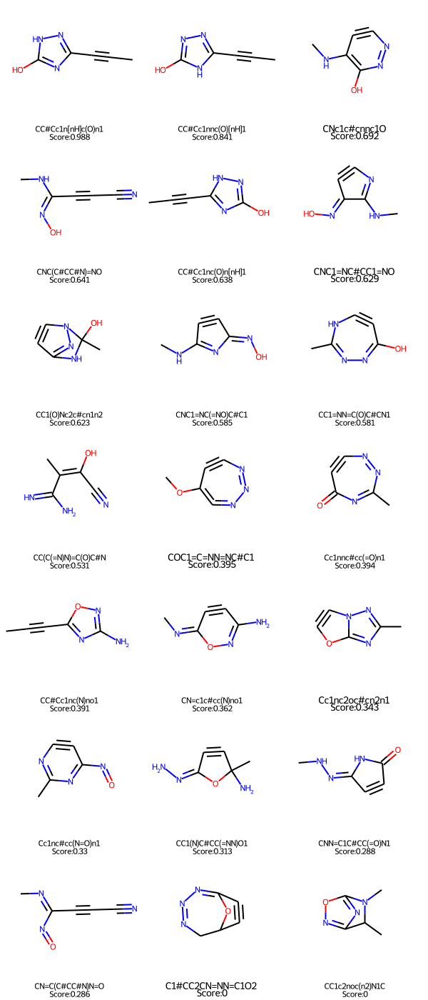

In [83]:
all_hits = {'CC#Cc1n[nH]c(O)n1':0.988117, 'CC#Cc1nnc(O)[nH]1':0.841,'CNc1c#cnnc1O':0.692,'CNC(C#CC#N)=NO':0.641,'CC#Cc1nc(O)n[nH]1':0.638,'CNC1=NC#CC1=NO':0.629,'CC1(O)Nc2c#cn1n2':0.623,'CNC1=NC(=NO)C#C1':0.585,'CC1=NN=C(O)C#CN1':0.581,'CC(C(=N)N)=C(O)C#N':0.531,'COC1=C=NN=NC#C1':0.395,'Cc1nnc#cc(=O)n1':0.394,'CC#Cc1nc(N)no1':0.391,'CN=c1c#cc(N)no1':0.362,'Cc1nc2oc#cn2n1':0.343,'Cc1nc#cc(N=O)n1':0.330,'CC1(N)C#CC(=NN)O1':0.313,'CNN=C1C#CC(=O)N1':0.288,'CN=C(C#CC#N)N=O':0.286,'C1#CC2CN=NN=C1O2':0,'CC1c2noc(n2)N1C':0}
all_mols = list()
all_vals = [x+'\nScore:'+str(all_hits[x])[:5] for x in list(all_hits.keys())]

for mol_str in all_hits:
    all_mols.append(Chem.MolFromSmiles(mol_str))

img = Chem.Draw.MolsToGridImage(all_mols, legends=all_vals, molsPerRow=3)
display(img)

In [4]:
with open('~/DeepSPInN/data/qm9_clean_ir_nmr.pickle', 'rb') as handle:
    nmr_ir_full = pickle.load(handle)

In [6]:
nmr_ir_full['test'][30]

('CC#Cc1n[nH]c(O)n1',
 [5, 3, 1, 0],
 array([0.00615349, 0.00624709, 0.0061186 , ..., 0.00073303, 0.00074302,
        0.00073892]),
 [(2.496510846141632, 3),
  (88.27117205673234, 0),
  (74.56719870856429, 0),
  (148.53861733361464, 0),
  (156.86076508668862, 0)],
 'dsgdb9nsd_124162')

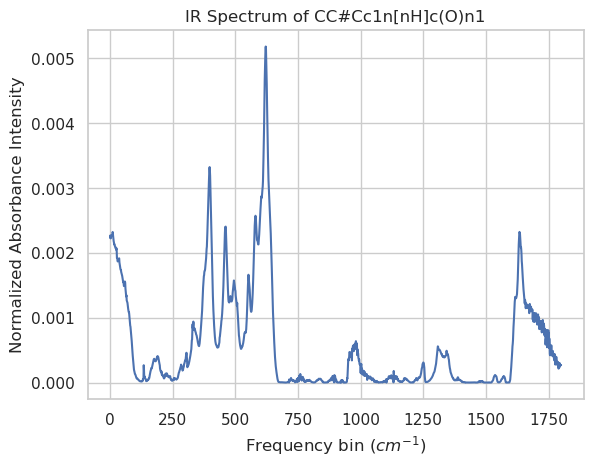

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

with sns.axes_style("whitegrid"):
    plt.plot(nmr_ir_full['test'][30][2]/sum(nmr_ir_full['test'][30][2]))
    plt.title(f"IR Spectrum of {nmr_ir_full['test'][30][0]}")
    plt.xlabel(r"Frequency bin ($cm^{-1}$)")
    plt.ylabel("Normalized Absorbance Intensity")
    plt.show()



[-1.503489153858368, 0.4965108461416321, 2.496510846141632, 4.496510846141632, 87.27117205673234, 73.56719870856429, 147.53861733361464, 155.86076508668862] [36.0, 38.0, 40.0, 38.0, 9.0, 9.0, 9.0, 9.0]


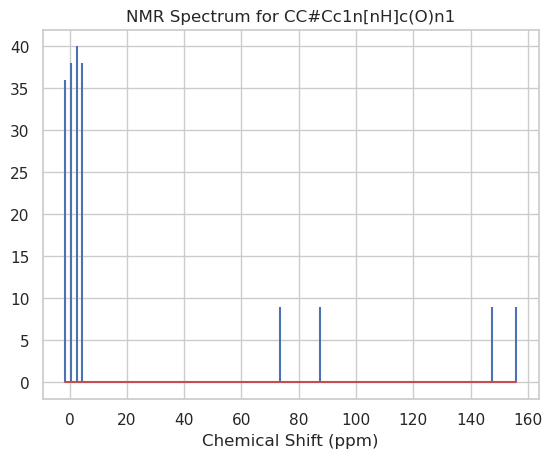

In [79]:
nmr_spec = nmr_ir_full['test'][30][3]

shifts = list()
intensities = list()
for x in nmr_spec:
    cur_shifts = [x[0]]*(x[1]+1)
    for idx in range(len(cur_shifts)):
        cur_shifts[idx] += (idx-len(cur_shifts)/2)*2
    shifts.extend(cur_shifts)
    cur_intensities = [(x[1]+1)*10]*(x[1]+1)
    for idx in range(len(cur_intensities)):
        cur_intensities[idx] += abs((idx-len(cur_intensities)/2))*(-2)
    intensities.extend(cur_intensities)
print(shifts, intensities)

with sns.axes_style("whitegrid"):
    plt.stem(shifts, intensities, markerfmt=" ")
    plt.title(f"NMR Spectrum for {nmr_ir_full['test'][30][0]}")
    plt.xlabel("Chemical Shift (ppm)")
    plt.show()